1. Загрузите датасет taxi.csv.
2. Посмотрите на данные. Отобразите общую информацию по признакам (вспомните о describe и info). Напишите в markdown свои наблюдения.
3. Выявите пропуски, а также возможные причины их возникновения. Решите, что следует сделать с ними. Напишите в markdown свои наблюдения.
4. Оцените зависимости переменных между собой. Используйте корреляции. Будет хорошо, если воспользуетесь profile_report. Напишите в markdown свои наблюдения.
5. Определите стратегию преобразования категориальных признаков (т.е. как их сделать адекватными для моделей).
6. Найдите признаки, которые можно разделить на другие, или преобразовать в другой тип данных. Удалите лишние, при необходимости.
7. Разделите выборку на обучаемую и тестовую.
8. Обучите модель. Напишите в markdown свои наблюдения по полученным результатам. Хорошие результаты дают классификаторы RandomForest и XGBoost

In [1]:
#импортируем все библиотеки, которые нам понадобятся для задания
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

import pandas as pd
from catboost import CatBoostClassifier
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV
from geopy.distance import geodesic
from geopy.distance import great_circle

# 1. Загрузите датасет taxi.csv.

In [2]:
data = pd.read_csv('taxi.csv')
data.head()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,-1.000,-1.000,Economy,private,0
1,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,25.217,Standard,private,1
2,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,9.800,Economy,private,0
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,-1.000,-1.000,Economy,private,1
4,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,19.250,Economy,private,1


# Посмотрите на данные. Отобразите общую информацию по признакам (вспомните о describe и info). Напишите в markdown свои наблюдения.

In [3]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
offer_gk,100000.0,566218.928650,325935.980081,4.0,285555.250000,565671.500000,848719.750000,1.130355e+06
weekday_key,100000.0,3.159860,2.054222,0.0,1.000000,3.000000,5.000000,6.000000e+00
hour_key,100000.0,13.827790,7.306496,0.0,8.000000,16.000000,20.000000,2.300000e+01
driver_gk,100000.0,3446.376360,2038.738677,14.0,1421.000000,3506.500000,5242.000000,6.806000e+03
order_gk,100000.0,460867.012910,266064.989530,18.0,229178.500000,462420.000000,690894.000000,9.203440e+05
driver_latitude,100000.0,55.700824,2.135903,-1.0,55.708651,55.772904,55.960667,5.617410e+01
driver_longitude,100000.0,37.492292,1.454640,-1.0,37.413497,37.533664,37.624113,3.828055e+01
origin_order_latitude,100000.0,55.772440,0.665985,-1.0,55.708032,55.772561,55.962000,5.631112e+01
origin_order_longitude,100000.0,37.541637,0.467758,-1.0,37.407117,37.532537,37.624358,3.824361e+01
distance_km,100000.0,18.393518,41.129296,-1.0,-1.000000,10.411500,30.665250,5.234283e+03


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 14 columns):
offer_gk                  100000 non-null int64
weekday_key               100000 non-null int64
hour_key                  100000 non-null int64
driver_gk                 100000 non-null int64
order_gk                  100000 non-null int64
driver_latitude           100000 non-null float64
driver_longitude          100000 non-null float64
origin_order_latitude     100000 non-null float64
origin_order_longitude    100000 non-null float64
distance_km               100000 non-null float64
duration_min              100000 non-null float64
offer_class_group         100000 non-null object
ride_type_desc            100000 non-null object
driver_response           100000 non-null int64
dtypes: float64(6), int64(6), object(2)
memory usage: 10.7+ MB


Общая информация по признакам:
driver_response - отклик водителя, целевая категориальная переменная.
offer_gk - номер предложения водителям, формируется после оформления ордера. 
Если водитель отказался, формируется новый под тем же ордером.
order_gk - заказ, присваевается сразу
driver_response - реакция водителя/отклик водителя
driver_gk - id водителя
weekday_key - день недели
hour_key - час суток
driver_latitude, longitude - месторасположение водителя на время получения заказа
origin_order_latitude, longitude - месторасположение заказа
distance_km, duration_min, offer_class_group, ride_type_desc - км и время в пути на выполнение, класc 

Аномалии
1. distance и duration  - отрицательные значения

Идеи по предобработке
1. добавить в фичи отдельно выделенные задвоенные ордеры с невыполненными поездками
(посмотреть, возможно они не только задвоены, но и затроены и тд)
2. выделить выбросы в виде отрицательных значений 
(заказы из других городов,возможно, либо неадекватные клиенты)
3. создать дополнительный признак день недели* час суток - в определенные промежутки времени заказов больше/меньше
4. создать дополнительный признак по удаленности водителя от заказа
5. offer_class_group и ride_type- посмотреть на варианты и заменить мелкие группы медианами(при необходимости)
6. проверить расстояние и время в пути на аномалии с помощью  графиков


создадим новый признак из дублированных заказов и посмотрим, как часто встречается и как много дублей

In [5]:
data['dubl_order'] = data.groupby(['order_gk']).cumcount()+1

In [6]:
(data['dubl_order']!=1).sum()/len(data.index)*100

18.565

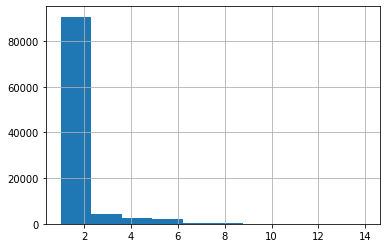

In [7]:
data['dubl_order'].hist()

In [8]:
data[data['dubl_order']>=2][data['driver_response']==0]

/Users/natalaurina/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response,dubl_order
644,417200,5,15,3929,226107,55.434402,37.872841,55.410307,37.902451,56.688,62.517,Standard,private,0,2
748,133552,4,22,3929,518050,55.452322,37.859236,55.410307,37.902451,-1.000,-1.000,Economy,business,0,2
2015,865055,5,23,6792,163284,55.417123,37.896658,55.410307,37.902451,43.166,53.417,Economy,private,0,2
2024,165301,5,23,6792,626429,55.415417,37.898268,55.410307,37.902451,50.189,58.650,Economy,private,0,2
2025,210712,5,23,6792,292442,55.415417,37.898268,55.410307,37.902451,53.358,54.683,Standard,private,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,726210,0,2,2442,27360,55.961246,37.413497,55.966694,37.415754,17.378,29.817,Economy,private,0,4
99996,881472,0,1,2442,381960,55.961246,37.413497,55.964892,37.413543,7.751,12.683,Economy,private,0,2
99997,626673,1,20,2442,627126,55.961315,37.413497,55.962203,37.416373,46.983,46.217,Standard,private,0,6
99998,672584,6,21,2442,140623,55.961354,37.413864,55.964892,37.413543,50.029,51.100,Economy,private,0,6


In [9]:
(data['duration_min']==-1).sum()

26207

In [10]:
data['driver_gk'].nunique()

439

Создадим еще один признак, который позе используем в модели для обучения - признак по выбросам(скорее всего отмена заявки)

In [11]:
data['delete'] = data['duration_min'] == -1
data.head()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response,dubl_order,delete
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,-1.000,-1.000,Economy,private,0,1,True
1,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,25.217,Standard,private,1,1,False
2,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,9.800,Economy,private,0,1,False
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,-1.000,-1.000,Economy,private,1,1,True
4,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,19.250,Economy,private,1,1,False


Посмотрим на еще один признак offer_class_group

In [12]:
data['offer_class_group'].value_counts()

Economy     48335
Standard    47288
Premium      1773
Delivery     1290
Kids          588
XL            464
VIP           225
VIP+           29
Test            8
Name: offer_class_group, dtype: int64

In [20]:
data[data['offer_class_group']=='Test']

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response,dubl_order,delete
12092,849177,5,20,3763,83260,55.820917,37.650258,55.827038,37.660981,-1.0,-1.0,Test,SMB,0,1,True
31035,1122239,3,23,6290,493264,55.959273,37.415073,55.962322,37.407117,-1.0,-1.0,Test,SMB,0,1,True
43940,897797,5,20,591,83260,55.821477,37.611275,55.827038,37.660981,-1.0,-1.0,Test,SMB,1,2,True
54657,954625,1,18,172,203179,55.823113,37.508883,55.829178,37.513307,-1.0,-1.0,Test,SMB,1,1,True
65028,1039723,1,15,1916,357476,55.881810,37.654255,55.872580,37.668403,-1.0,-1.0,Test,SMB,1,1,True
82848,990065,2,14,3371,325838,55.775556,37.582864,55.773730,37.591352,-1.0,-1.0,Test,SMB,1,1,True
95758,159224,5,17,1126,392645,55.761183,37.657616,55.757251,37.659064,-1.0,-1.0,Test,SMB,1,1,True
97311,1060685,3,23,6302,493264,55.964894,37.413532,55.962322,37.407117,-1.0,-1.0,Test,SMB,1,2,True


Будем использовать CatBoost, поэтому необходимости в "размазывании" test и других малых групп нет

In [21]:
data['ride_type_desc'].value_counts()

private      91207
business      8533
affiliate      224
SMB             36
Name: ride_type_desc, dtype: int64

создадим дополнительный признак в виде расстояния от местонахождения водителя клиента до местоположения клиента

In [22]:
data['driver_client_distance'] = data.apply(lambda x: great_circle((x['origin_order_latitude'], x['origin_order_longitude']), (x['driver_latitude'], x['driver_longitude'])).km, axis=1)


посмотрим, зависит ли выполнение заказа от дня недели и времени

In [23]:
data.groupby(['weekday_key', 'hour_key']).agg({'driver_response': ['mean', 'count']})

driver_response      
                                mean count
weekday_key hour_key                      
0           0               0.352185  1167
            1               0.456790   648
            2               0.462523   547
            3               0.409091   440
            4               0.325726   482
...                              ...   ...
6           19              0.588467   763
            20              0.540243   907
            21              0.382330  1279
            22              0.472141  1023
            23              0.359108  1345

[168 rows x 2 columns]

In [24]:
#новый столбец - mean_week_hour - среднее количество откликов по дням и часам
data['mean_weekday_hour'] = data['weekday_key']*data['weekday_key']
data.head()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response,dubl_order,delete,driver_client_distance,mean_weekday_hour
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,-1.000,-1.000,Economy,private,0,1,True,1.363047,25
1,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,25.217,Standard,private,1,1,False,3.413097,25
2,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,9.800,Economy,private,0,1,False,0.410000,36
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,-1.000,-1.000,Economy,private,1,1,True,0.647473,4
4,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,19.250,Economy,private,1,1,False,1.062483,16


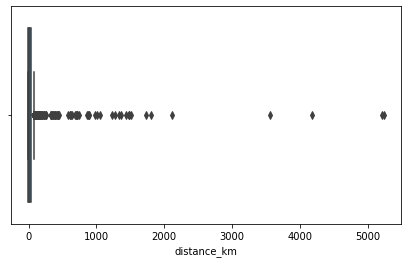

In [25]:
plt.figure(figsize=(7,4))
sns.boxplot(x=data['distance_km'])

In [26]:
#что за данные,где расстояние более 5000 км?
data[data['distance_km']>5000]

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response,dubl_order,delete,driver_client_distance,mean_weekday_hour
37485,552747,1,18,6666,219128,55.746030,37.537630,55.757527,37.549621,5215.793,3947.383,VIP,private,1,1,False,1.482362,1
90848,762904,5,2,3078,660414,55.723698,37.406337,55.709790,37.419540,5234.283,3958.283,Standard,private,0,1,False,1.753720,25


большая дистанция, время в пути тоже немалое. если мы быдем использовать CatBoost,данные тоже нужны

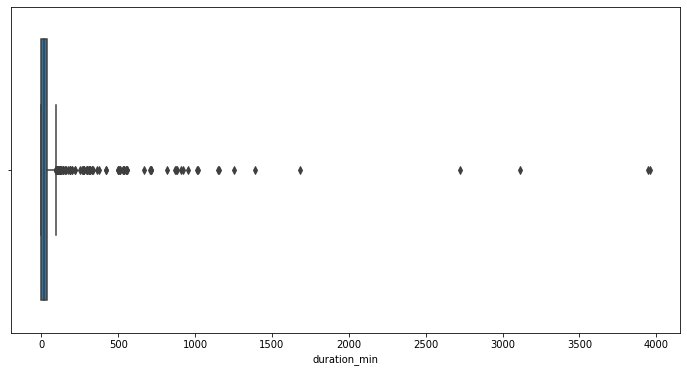

In [27]:
plt.figure(figsize=(12,6))
sns.boxplot(x=data['duration_min'])

посмотрим на возможные выбросы по расстоянию и времени в пути

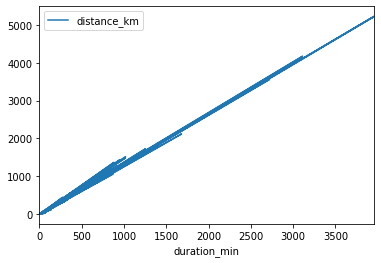

In [28]:
data.plot(x='duration_min', y='distance_km')
plt.show()


более-менее линейная зависимость без особенных перекосов

# Выявите пропуски, а также возможные причины их возникновения. Решите, что следует сделать с ними. Напишите в markdown свои наблюдения.

In [29]:
data.isnull().sum()

offer_gk                  0
weekday_key               0
hour_key                  0
driver_gk                 0
order_gk                  0
driver_latitude           0
driver_longitude          0
origin_order_latitude     0
origin_order_longitude    0
distance_km               0
duration_min              0
offer_class_group         0
ride_type_desc            0
driver_response           0
dubl_order                0
delete                    0
driver_client_distance    0
mean_weekday_hour         0
dtype: int64

пропусков нет - это было уже видно из info первоначально(non-null)

# Оцените зависимости переменных между собой. Используйте корреляции. Будет хорошо, если воспользуетесь profile_report. Напишите в markdown свои наблюдения.

In [30]:
import pandas_profiling
data.profile_report()

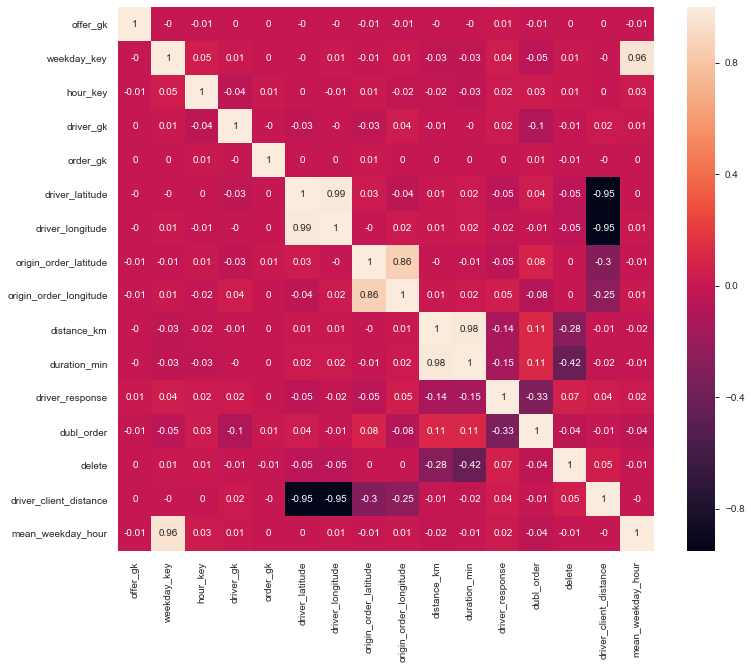

In [31]:
correlation_matrix = data.corr().round(2)
# annot = True to print the values inside the square
fig, ax = plt.subplots(figsize=(12,10)) 
sns.heatmap(data=correlation_matrix, annot=True)

сильно коррелирующих изначальныхзависимостей нет в наличии, только по дополнительно созданным признакам

In [32]:

def submit(rgr, x):
    y = pd.Series(rgr.predict(x), index=x.index).to_frame()
    y.to_csv('submit.csv')

# Определите стратегию преобразования категориальных признаков (т.е. как их сделать адекватными для моделей).

разделим признаки на обычные и категориальные.
Необходимости в encoding нет, как и в удалении выбросов таких как отрицательные значения(отмены) или многоразовые дубли заказа, где поездка так и не состоялась, при использовании бустинга при классификации,
поскольку в лучшем случае он не понизит точность нашей модели

In [33]:
cat_features = ['weekday_key', 'offer_class_group', 'ride_type_desc', 'mean_weekday_hour', 'delete' ]
features = ['hour_key', 'driver_latitude', 'driver_longitude', 'origin_order_latitude', 
            'origin_order_longitude', 'distance_km', 'duration_min', 'dubl_order', 'driver_client_distance'] + cat_features

Покажем, что некоторые из признаков категориальные,чтобы можно было их разместить в Catboost- надо указать их номера столбцов


In [34]:
x, y = data[features], data['driver_response']
cat_features = np.where(x.columns.isin(cat_features))[0]

# Разделите выборку на обучаемую и тестовую.

In [35]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=31)

# Найдите признаки, которые можно разделить на другие, или преобразовать в другой тип данных. Удалите лишние, при необходимости.

Функция, которая сама выбирает классификатор или регрессор - R2 или рок аук(можно заменить еще на что то

In [36]:
def score(clf, x_train, x_test, y_train, y_test):
    try:
        y_pred_train, y_pred_test = clf.predict_proba(x_train)[:, 1], clf.predict_proba(x_test)[:, 1]
        print(f'Train-test roc auc: {roc_auc_score(y_train.astype(bool), y_pred_train)}, {roc_auc_score(y_test.astype(bool), y_pred_test)}')
    except AttributeError:
        y_pred_train, y_pred_test = clf.predict(x_train), clf.predict(x_test)
        print(f'Train-test r2 score: {r2_score(y_train, y_pred_train)}, {r2_score(y_test, y_pred_test)}')

# Обучите модель. Напишите в markdown свои наблюдения по полученным результатам. Хорошие результаты дают классификаторы RandomForest и XGBoost

In [37]:
rgr = CatBoostClassifier(n_estimators=100, learning_rate=0.2, max_depth=4, silent=False, cat_features=cat_features, eval_metric='AUC')
rgr.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_test, y_test)])
score(rgr, x_train, x_test, y_train, y_test)

0:	test: 0.7955344	test1: 0.7952296	best: 0.7952296 (0)	total: 199ms	remaining: 19.7s
1:	test: 0.7977316	test1: 0.7973903	best: 0.7973903 (1)	total: 262ms	remaining: 12.9s
2:	test: 0.8036822	test1: 0.8033938	best: 0.8033938 (2)	total: 323ms	remaining: 10.4s
3:	test: 0.8096333	test1: 0.8098285	best: 0.8098285 (3)	total: 361ms	remaining: 8.65s
4:	test: 0.8099961	test1: 0.8101649	best: 0.8101649 (4)	total: 400ms	remaining: 7.6s
5:	test: 0.8150010	test1: 0.8141171	best: 0.8141171 (5)	total: 451ms	remaining: 7.07s
6:	test: 0.8150894	test1: 0.8138988	best: 0.8141171 (5)	total: 490ms	remaining: 6.5s
7:	test: 0.8169832	test1: 0.8171374	best: 0.8171374 (7)	total: 533ms	remaining: 6.13s
8:	test: 0.8174044	test1: 0.8187165	best: 0.8187165 (8)	total: 572ms	remaining: 5.79s
9:	test: 0.8261893	test1: 0.8277008	best: 0.8277008 (9)	total: 619ms	remaining: 5.57s
10:	test: 0.8290700	test1: 0.8301711	best: 0.8301711 (10)	total: 650ms	remaining: 5.26s
11:	test: 0.8302626	test1: 0.8315726	best: 0.8315726 (

94:	test: 0.8515757	test1: 0.8498746	best: 0.8498746 (94)	total: 4.69s	remaining: 247ms
95:	test: 0.8516184	test1: 0.8498797	best: 0.8498797 (95)	total: 4.72s	remaining: 197ms
96:	test: 0.8516414	test1: 0.8499124	best: 0.8499124 (96)	total: 4.75s	remaining: 147ms
97:	test: 0.8517663	test1: 0.8499947	best: 0.8499947 (97)	total: 4.78s	remaining: 97.5ms
98:	test: 0.8518508	test1: 0.8501119	best: 0.8501119 (98)	total: 4.81s	remaining: 48.6ms
99:	test: 0.8518905	test1: 0.8501554	best: 0.8501554 (99)	total: 4.84s	remaining: 0us

bestTest = 0.850155409
bestIteration = 99

Train-test roc auc: 0.8518905233670632, 0.8501554090136538


85% - точность предсказания по признакам, поедет ли водитель